# ISRO SAC Forecast Viz

In [ ]:
import datetime

print(f"Last updated: {datetime.datetime.now()}")

Last updated: 2023-06-04 15:50:55.433502


In [ ]:
# %load_ext rich
%load_ext watermark

import xarray as xr
from pathlib import Path

import pandas as pd
import holoviews as hv


hv.notebook_extension("bokeh")

%watermark -iv

/glade/u/home/dcherian/miniconda3/envs/astral/lib/python3.11/site-packages/xclim/indices/fire/_cffwis.py:206: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @jit
/glade/u/home/dcherian/miniconda3/envs/astral/lib/python3.11/site-packages/xclim/indices/fire/_cffwis.py:226: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @jit


pandas   : 1.5.3
xarray   : 2022.12.0
hvplot   : 0.8.3
holoviews: 1.16.1
climpred : 2.3.0
sys      : 3.11.3 | packaged by conda-forge | (main, Apr  6 2023, 08:57:19) [GCC 11.3.0]
json     : 2.0.9



In [ ]:
LOCS = {"AD07": {"latitude": 14.93, "longitude": 68.98}}

## Read data

In [ ]:
folder = Path("/glade/scratch/acsubram/EKAMSAT/")
files = [
    file
    for file in sorted(folder.glob("*.nc"))
    if "20230601.nc" not in file.name  # incomplete file
]
files

[PosixPath('/glade/scratch/acsubram/EKAMSAT/SAC_OSF_CIRC_10KM_20230602.nc'),
 PosixPath('/glade/scratch/acsubram/EKAMSAT/SAC_OSF_CIRC_10KM_20230603.nc')]

In [ ]:
def preprocess(ds0):
    init = ds0.Time.attrs["units"].split(" ")[2]
    ds0.coords["init"] = pd.Timestamp(init)
    ds0["init"].attrs["standard_name"] = "forecast_reference_time"
    ds0 = ds0.expand_dims("init")

    ds0 = ds0.rename({"Time": "lead"})
    ds0["lead"].attrs = {"standard_name": "forecast_period"}
    ds0["lead"] = ds0.lead.astype("timedelta64[h]")

    ds0.coords["time"] = ds0.init + ds0.lead
    ds0.time.attrs.update({"axis": "T", "standard_name": "time"})

    return ds0


ds = xr.open_mfdataset(
    files,
    preprocess=preprocess,
    decode_times=False,
    combine="nested",
    concat_dim="init",
    coords="minimal",
    join="exact",
    compat="override",
)
ds

<xarray.Dataset>
Dimensions:   (xt_i: 560, yt_j: 400, xu_i: 560, yu_j: 400, zt_k: 50, lead: 21,
               init: 2)
Coordinates:
  * xt_i      (xt_i) float32 27.5 28.5 29.48 30.46 ... 138.5 139.5 140.5 141.5
  * yt_j      (yt_j) float32 -34.5 -33.5 -32.52 -31.54 ... 25.75 25.85 25.95
  * xu_i      (xu_i) float32 28.0 28.99 29.97 30.93 ... 139.0 140.0 141.0 142.0
  * yu_j      (yu_j) float32 -34.0 -33.01 -32.03 -31.07 ... 25.7 25.8 25.9 26.0
  * zt_k      (zt_k) float32 1.0 3.017 5.084 ... 4.175e+03 4.731e+03 5.32e+03
  * lead      (lead) timedelta64[ns] 0 days 00:00:00 ... 5 days 00:00:00
  * init      (init) datetime64[ns] 2023-06-02 2023-06-03
    time      (init, lead) datetime64[ns] 2023-06-02 ... 2023-06-08
Data variables:
    temp      (init, lead, zt_k, yt_j, xt_i) float32 dask.array<chunksize=(1, 21, 50, 400, 560), meta=np.ndarray>
    salinity  (init, lead, zt_k, yt_j, xt_i) float32 dask.array<chunksize=(1, 21, 50, 400, 560), meta=np.ndarray>
    u         (init, lead, zt_k, yu_j, xu_i) float32 dask.array<chunksize=(1, 21, 50, 400, 560), meta=np.ndarray>
    v         (init, lead, zt_k, yu_j, xu_i) float32 dask.array<chunksize=(1, 21, 50, 400, 560), meta=np.ndarray>
    hmxl      (init, lead, yt_j, xt_i) float32 dask.array<chunksize=(1, 21, 400, 560), meta=np.ndarray>
Attributes:
    CDI:             Climate Data Interface version 1.7.0 (http://mpimet.mpg....
    Conventions:     CF-1.4
    history:         Fri Jun 02 16:25:33 2023: cdo cat -settaxis,2023-06-02,0...
    filename:        time_mean.000047.06.02.dta.nc
    MPP_IO_VERSION:  $Id: mpp_io.F90,v 5.3 1999/12/03 16:59:31 vb Exp $
    title:           Time mean  {MOM 3.0}
    CDO:             Climate Data Operators version 1.7.0 (http://mpimet.mpg....

## AD07

In [ ]:
ad07 = ds.cf.sel(**LOCS["AD07"], method="nearest").cf.sel(Z=slice(500)).load()

### SST, SSS

In [ ]:
surf = ad07.cf.sel(Z=0, method="nearest").load()
(
    surf.temp.hvplot.line(x="time", by="init")
    + surf.salinity.hvplot.line(x="time", by="init")
).cols(1)

:Layout
   .NdOverlay.I  :NdOverlay   [init]
      :Curve   [time]   (temp)
   .NdOverlay.II :NdOverlay   [init]
      :Curve   [time]   (salinity)

### Latest T, S

In [ ]:
def plot_profile(da, **kwargs):
    return (
        da.cf.sel(Z=slice(500))
        .isel(init=-1)
        .swap_dims({"lead": "time"})
        .hvplot.quadmesh(
            x="time",
            y="zt_k",
            cmap="coolwarm",
            **kwargs,
        )
        .opts(title=f"AD07 - initialized {da.init[-1].dt.strftime('%Y-%m-%d').data}")
    )


(
    plot_profile(ad07.temp, clim=(19, 31)) + plot_profile(ad07.salinity, clim=(34, 37))
).opts(hv.opts.QuadMesh(invert_yaxis=True, ylim=(160, 0))).cols(1)

:Layout
   .QuadMesh.I  :QuadMesh   [time,zt_k]   (temp)
   .QuadMesh.II :QuadMesh   [time,zt_k]   (salinity)

## T, S, U, V maps

In [ ]:
subset = ds.cf.sel(
    X=slice(70, 80), Y=slice(3, 20), Z=slice(200), lead=slice(None, None, 4)
).load()
decimated = subset.cf.isel(
    init=-1, Y=slice(None, None, 4), X=slice(None, None, 4)
).load()

In [ ]:
def plot_facetgrid(da):
    fg = (
        da.cf.sel(Z=[0, 25, 50], method="nearest")
        .isel(init=-1)
        .plot(
            x="xt_i",
            y="yt_j",
            row="zt_k",
            col="lead",
            robust=True,
            cbar_kwargs={
                "shrink": 0.8,
                "aspect": 40,
                "orientation": "horizontal",
                "location": "top",
            },
            cmap="coolwarm",
            aspect=1 / 2,
            size=4,
        )
    )
    for ax, loc in zip(fg.axs.ravel(), fg.name_dicts.ravel()):
        (
            (decimated[["u", "v"]] / 100)
            .cf.sel(loc)
            .cf.plot.quiver(
                x="X",
                y="Y",
                u="u",
                v="v",
                ax=ax,
                add_guide=False,
                scale=3,
            )
        )
    import dcpy

    dcpy.plots.clean_axes(fg.axs)
    fg.set_titles()
    fg.fig.suptitle(f"initialized: {da.init[-1].dt.strftime('%Y-%m-%d').data}", y=0.9)
    return fg

### T

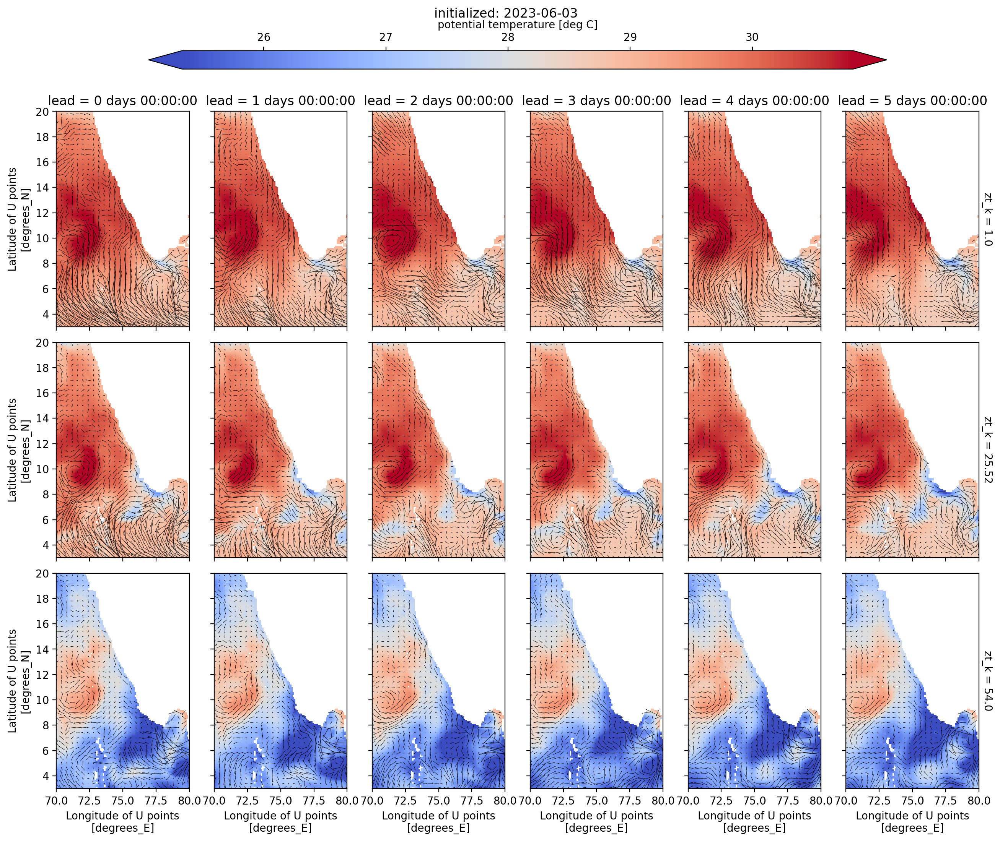

In [ ]:
plot_facetgrid(subset.temp)

### S

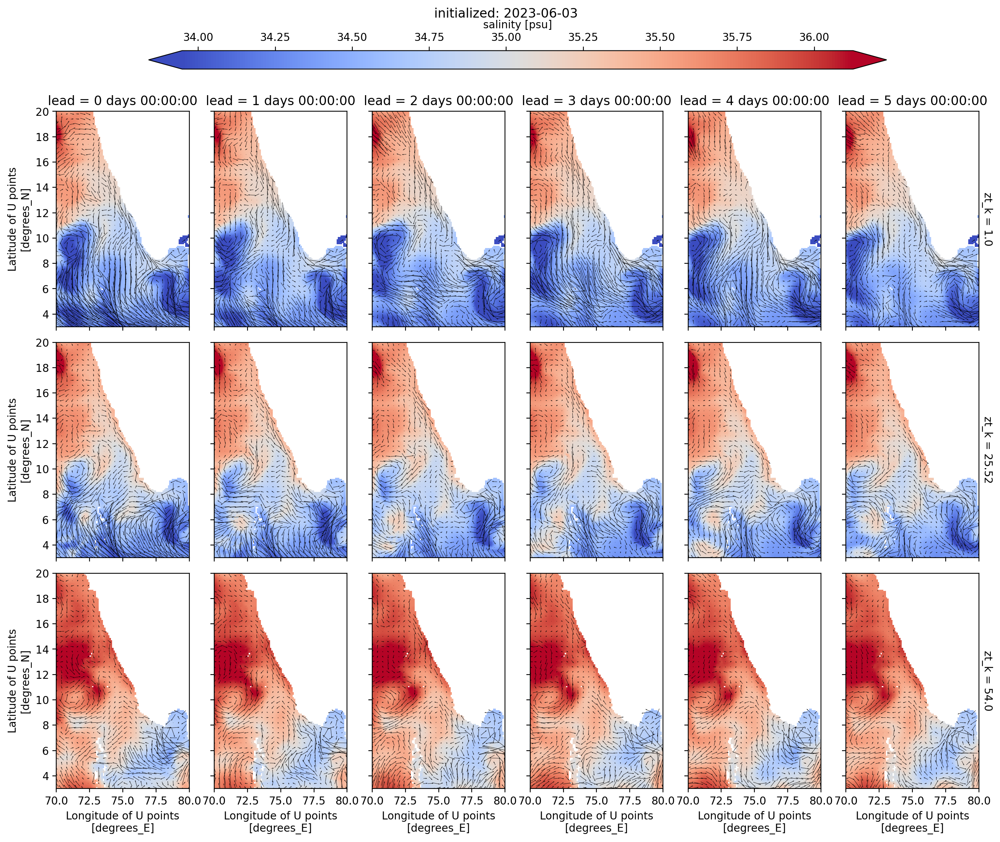

In [ ]:
plot_facetgrid(subset.salinity)

## Development

### preprocessing function

In [ ]:
ds0 = xr.open_dataset(
    "/glade/scratch/acsubram/EKAMSAT/SAC_OSF_CIRC_10KM_20230603.nc",
    decode_times=False,
    chunks={"zt_k": 1, "Time": -1},
)
preprocess(ds0)

### Offset line plot?

In [ ]:
import dcpy

In [ ]:
offset(ad07.temp, offset=10, remove_mean=False, x="zt_k", y="lead")

<xarray.DataArray (init: 2, lead: 21, zt_k: 33)>
array([[[ 29.95442581,  29.95405388,  29.95360565, ...,  12.51207066,
          11.80128288,  11.1895113 ],
        [ 39.94475174,  39.94635391,  39.94699097, ...,  22.46932793,
          21.77159023,  21.16801357],
        [ 50.09959221,  50.08679008,  50.08819389, ...,  32.453866  ,
          31.75545883,  31.14904308],
        ...,
        [210.7594738 , 210.7606945 , 210.76254082, ..., 192.43937588,
         191.73908234, 191.13039398],
        [220.78314972, 220.78468895, 220.77948761, ..., 202.47106743,
         201.75921345, 201.14242649],
        [230.57883835, 230.57347107, 230.56607437, ..., 212.51642323,
         211.7903347 , 211.16440105]],

       [[ 29.92786789,  29.92484474,  29.91988945, ...,  12.46310997,
          11.75592041,  11.14198303],
        [ 39.90850639,  39.90826416,  39.8913002 , ...,  22.45376682,
          21.75043201,  21.1408968 ],
        [ 50.10733604,  50.10686302,  50.01116943, ...,  32.42247868,
          31.72996998,  31.13178253],
        ...,
        [210.54725456, 210.35758972, 210.35797882, ..., 192.45038795,
         191.74902153, 191.14433861],
        [220.64549065, 220.41614151, 220.41784286, ..., 202.44432163,
         201.74848652, 201.14797592],
        [230.39606285, 230.37463379, 230.37558746, ..., 212.4468441 ,
         211.74905682, 211.14678955]]])
Coordinates:
    xt_i     float32 68.95
    yt_j     float32 14.95
    xu_i     float32 69.0
    yu_j     float32 14.9
  * zt_k     (zt_k) float32 1.0 3.017 5.084 7.23 ... 316.1 363.7 423.7 496.1
  * lead     (lead) timedelta64[ns] 0 days 00:00:00 ... 5 days 00:00:00
  * init     (init) datetime64[ns] 2023-06-02 2023-06-03
    time     (init, lead) datetime64[ns] 2023-06-02 ... 2023-06-08

In [ ]:
def offset(da, x, y, offset=0, remove_mean=False):
    import numpy as np

    assert da[y].ndim == 1

    off = xr.DataArray(np.arange(da.sizes[y]), dims=y)
    off *= offset

    # remove mean and add offset
    if remove_mean:
        daoffset = da.groupby(y) - da.groupby(y).mean()
    else:
        daoffset = da

    daoffset = daoffset + off

    return daoffset


(
    offset(ad07.temp, offset=10, remove_mean=False, x="zt_k", y="lead").hvplot.line(
        y="zt_k", by="time", groupby="init", color="b", legend=False, flip_yaxis=True
    )
)

:DynamicMap   [init]
   :NdOverlay   [time]
      :Curve   [value]   (zt_k)

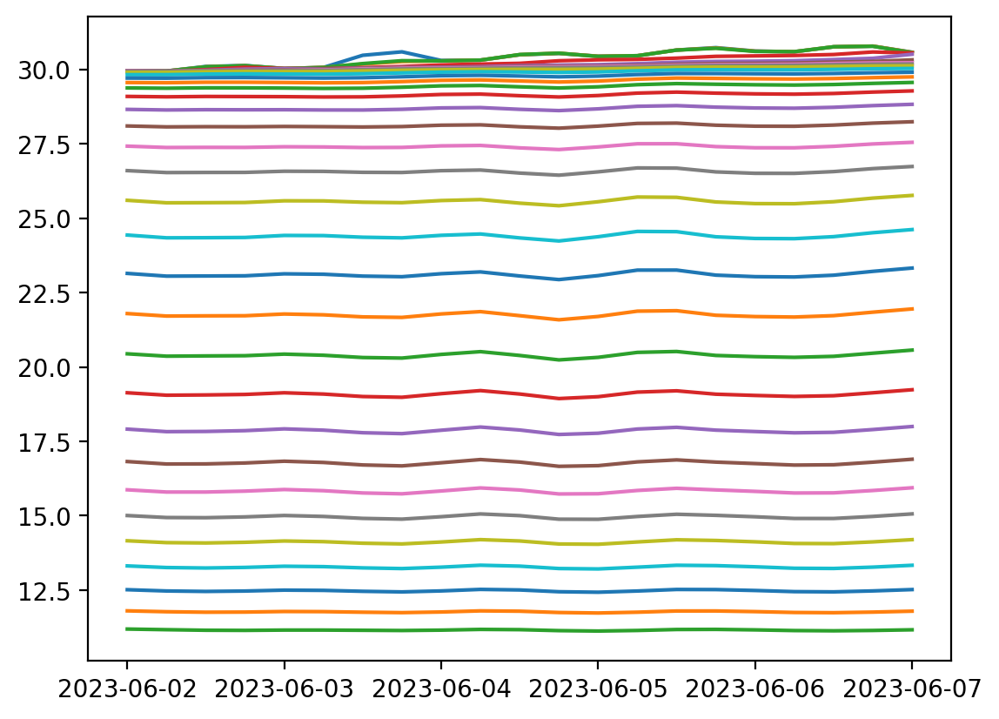

In [ ]:
dcpy.plots.offset_line_plot(ad07.temp.isel(init=0), x="time", y="zt_k", legend=False);

<xarray.DataArray 'temp' (lead: 21, zt_k: 33)>
array([[29.954426 , 29.954054 , 29.953606 , 29.953012 , 29.952417 ,
        29.952013 , 29.948467 , 29.938328 , 29.900108 , 29.824247 ,
        29.709068 , 29.559511 , 29.378286 , 29.093317 , 28.657272 ,
        28.099834 , 27.422132 , 26.598864 , 25.600628 , 24.43335  ,
        23.143854 , 21.793863 , 20.44098  , 19.131796 , 17.910059 ,
        16.819826 , 15.87026  , 15.005112 , 14.156846 , 13.312398 ,
        12.512071 , 11.801283 , 11.189511 ],
       [29.944752 , 29.946354 , 29.946991 , 29.938164 , 29.936245 ,
        29.934977 , 29.93492  , 29.938679 , 29.902218 , 29.82416  ,
        29.705896 , 29.55329  , 29.368538 , 29.07971  , 28.637388 ,
        28.06937  , 27.376083 , 26.53346  , 25.517237 , 24.340263 ,
        23.052378 , 21.710245 , 20.36166  , 19.049728 , 17.82481  ,
        16.737085 , 15.795267 , 14.937958 , 14.094563 , 13.25716  ,
        12.469328 , 11.77159  , 11.168014 ],
       [30.099592 , 30.08679  , 30.088194 , 29.993423 , 29.969982 ,
        29.957474 , 29.957407 , 29.956194 , 29.921764 , 29.84306  ,
        29.723734 , 29.569199 , 29.382446 , 29.092043 , 28.646965 ,
        28.075777 , 27.380806 , 26.537592 , 25.521164 , 24.344143 ,
        23.057102 , 21.717232 , 20.370575 , 19.058731 , 17.831741 ,
        16.740614 , 15.795173 , 14.932602 , 14.082762 , 13.242013 ,
...
        30.245247 , 30.200144 , 30.160309 , 30.09933  , 30.00184  ,
        29.863546 , 29.693106 , 29.493547 , 29.191948 , 28.727606 ,
        28.12998  , 27.41582  , 26.566378 , 25.553707 , 24.379477 ,
        23.083807 , 21.723997 , 20.35661  , 19.032675 , 17.80197  ,
        16.711609 , 15.7674055, 14.906038 , 14.060964 , 13.225917 ,
        12.439376 , 11.739082 , 11.130394 ],
       [30.78315  , 30.784689 , 30.779488 , 30.586466 , 30.37446  ,
        30.269175 , 30.219189 , 30.177134 , 30.115963 , 30.020958 ,
        29.888018 , 29.723948 , 29.531614 , 29.23916  , 28.783897 ,
        28.195374 , 27.495436 , 26.666716 , 25.674976 , 24.511827 ,
        23.212915 , 21.841074 , 20.462225 , 19.131186 , 17.895548 ,
        16.798922 , 15.846214 , 14.975367 , 14.119396 , 13.271207 ,
        12.471067 , 11.759213 , 11.1424265],
       [30.578838 , 30.573471 , 30.566074 , 30.55383  , 30.510376 ,
        30.322014 , 30.22393  , 30.182034 , 30.123331 , 30.033089 ,
        29.906893 , 29.749392 , 29.563404 , 29.278502 , 28.827553 ,
        28.241426 , 27.549744 , 26.737347 , 25.765343 , 24.61733  ,
        23.32362  , 21.948978 , 20.565966 , 19.233343 , 17.997099 ,
        16.897068 , 15.93809  , 15.060134 , 14.194716 , 13.3327675,
        12.516423 , 11.790335 , 11.164401 ]], dtype=float32)
Coordinates:
    xt_i     float32 68.95
    yt_j     float32 14.95
    xu_i     float32 69.0
    yu_j     float32 14.9
  * zt_k     (zt_k) float32 1.0 3.017 5.084 7.23 ... 316.1 363.7 423.7 496.1
  * lead     (lead) timedelta64[ns] 0 days 00:00:00 ... 5 days 00:00:00
    init     datetime64[ns] 2023-06-02
    time     (lead) datetime64[ns] 2023-06-02 2023-06-02T06:00:00 ... 2023-06-07
Attributes:
    long_name:  potential temperature
    units:      deg C